# Autores:

- Massotto, Fabian
- Pertierra, Valentín
- Saraco, Leandro

---

## Propuesta de investigación

El siguiente trabajo pretende construir un modelo capaz de predecir la cantidad de robos que pudieran ocurrir en la Ciudad de Bs As en un día dado, dependiendo de las condiciones climáticas.

Para ello se utilizarán los siguientes datasets:

- Datos de clima: [Historical weather API](https://open-meteo.com/en/docs/historical-weather-api#latitude=-34.6036&longitude=-58.3818&hourly=temperature_2m,relative_humidity_2m,dew_point_2m,apparent_temperature,precipitation,rain,weather_code,pressure_msl,surface_pressure,cloud_cover,cloud_cover_low,cloud_cover_mid,cloud_cover_high,wind_speed_10m,wind_direction_10m,wind_gusts_10m,is_day,sunshine_duration&daily=&timezone=auto)
- Datos de delitos: [Buenos Aires Data](https://data.buenosaires.gob.ar/dataset/delitos)

In [233]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Pre-processing y metricas
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from sklearn.preprocessing import StandardScaler

#Modelos
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor, export_graphviz
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
import xgboost as xgb

#PCA
from sklearn.decomposition import PCA

### 1. Dataset de clima

Los atributos son:

Atributo | Descripción | Unidad 
:---: | :---: | :---: 
`date` | Fecha y hora de los datos. | Hora
`temperature_2m` | Temperatura del aire a 2 metros del suelo. | °C           
`relative_humidity_2m` | Humedad relativa a 2 metros del suelo | %    
`dew_point_2m` | Temperatura del punto de rocío a 2 metros del suelo. | °C           
`apparent_temperature` | La temperatura aparente es la temperatura percibida que combina el factor de sensación térmica, la humedad relativa y la radiación solar. | °C    
`precipitation` | Suma de precipitaciones totales (lluvias, chubascos, nieve) de la hora anterior. | mm          
`rain` | Sólo precipitaciones líquidas de la hora anterior, incluidos chubascos locales y lluvias de sistemas a gran escala. | mm                   
`weather_code` | Condición climática como código numérico. El código meteorológico se calcula a partir del análisis de la nubosidad, las precipitaciones y las nevadas. | Código WMO           
`pressure_msl` | Presión del aire atmosférico al nivel del mar. | hPa            
`surface_pressure` | Presión en la superficie | hPa        
`cloud_cover` | Cobertura total de nubes como fracción de área | %            
`cloud_cover_low` | Nubes bajas y niebla hasta 2 km de altitud. | %         
`cloud_cover_mid` | Nubes de nivel medio de 2 a 6 km de altitud. | %        
`cloud_cover_high` | Nubes de alto nivel desde 6 km de altitud. | %        
`wind_speed_10m` |  Velocidad del viento a 10 metros del suelo. | km/h  
`wind_direction_10m` | Dirección del viento a 10 metros sobre el suelo. | °      
`wind_gusts_10m` | Ráfagas de viento a 10 metros sobre el suelo. | km/h      
`is_day` | Indica si es de día o noche. | 0, 1           
`sunshine_duration` | El número de segundos de sol al día. | segs       

In [234]:
clima_df = pd.read_csv('data/clima.csv')
clima_df.head()

,date,temperature_2m,relative_humidity_2m,dew_point_2m,apparent_temperature,precipitation,rain,weather_code,pressure_msl,surface_pressure,cloud_cover,cloud_cover_low,cloud_cover_mid,cloud_cover_high,wind_speed_10m,wind_direction_10m,wind_gusts_10m,is_day,sunshine_duration
0,2015-01-01 03:00:00+00:00,21.491499,92.314280,20.191500,24.450254,0.0,0.0,1.0,1003.5,1001.17615,36.600000,36.0,7.0,0.0,6.877790,173.99109,11.879999,0.0,0.0
1,2015-01-01 04:00:00+00:00,21.141500,94.024980,20.141500,23.918465,0.0,0.0,1.0,1003.9,1001.57250,41.700000,35.0,17.0,0.0,7.952660,174.80566,10.799999,0.0,0.0
2,2015-01-01 05:00:00+00:00,21.141500,94.608025,20.241499,23.866808,0.0,0.0,2.0,1003.4,1001.07367,51.600000,42.0,23.0,0.0,8.654986,163.07240,11.159999,0.0,0.0
3,2015-01-01 06:00:00+00:00,21.091500,94.606060,20.191500,23.559443,0.2,0.2,51.0,1003.3,1000.97350,99.299995,77.0,49.0,2.0,10.245780,161.56496,25.919998,0.0,0.0
4,2015-01-01 07:00:00+00:00,20.841500,87.516220,18.691500,22.161537,0.1,0.1,51.0,1003.0,1000.67230,100.000000,82.0,49.0,26.0,13.104197,159.07542,19.440000,0.0,0.0


In [235]:
clima_df.describe()

,temperature_2m,relative_humidity_2m,dew_point_2m,apparent_temperature,precipitation,rain,weather_code,pressure_msl,surface_pressure,cloud_cover,cloud_cover_low,cloud_cover_mid,cloud_cover_high,wind_speed_10m,wind_direction_10m,wind_gusts_10m,is_day,sunshine_duration
count,78888.000000,78888.000000,78888.000000,78888.000000,78888.000000,78888.000000,78888.000000,78888.000000,78888.000000,78888.000000,78888.000000,78888.000000,78888.000000,78888.000000,78888.000000,78888.000000,78888.000000,78888.000000
mean,17.531648,73.027569,12.225483,16.333675,0.107847,0.107844,6.332585,1015.760484,1013.375030,31.695227,16.922092,17.453998,31.351397,16.201031,154.521043,29.092004,0.506554,1388.382713
std,6.109760,15.383671,5.580198,7.884538,0.645694,0.645694,16.411272,6.264845,6.220899,34.894072,32.058177,30.495632,40.859259,6.934614,104.205411,11.490423,0.499960,1695.734092
min,-0.745500,16.979210,-7.095500,-4.590961,0.000000,0.000000,0.000000,993.600000,991.238200,0.000000,0.000000,0.000000,0.000000,0.000000,0.572935,1.440000,0.000000,0.000000
25%,12.854500,63.291204,8.241500,10.205516,0.000000,0.000000,0.000000,1011.300000,1008.978240,0.000000,0.000000,0.000000,0.000000,11.165805,69.764846,20.880001,0.000000,0.000000
50%,17.504500,75.138553,12.454500,16.116308,0.000000,0.000000,1.000000,1015.600000,1013.165715,20.400002,0.000000,0.000000,1.000000,15.580141,132.709370,28.080000,1.000000,0.000000
75%,22.104500,85.002599,16.504500,22.281742,0.000000,0.000000,2.000000,1019.900000,1017.524200,54.600000,13.000000,21.000000,78.000000,20.620806,231.562670,36.360000,1.000000,3600.000000
max,38.854500,100.000000,26.254500,41.186527,29.000000,29.000000,71.000000,1037.300000,1034.749400,100.000000,100.000000,100.000000,100.000000,52.767944,360.000000,95.760000,1.000000,3600.000000


In [236]:
print(f"Cantidad de filas: {clima_df.shape[0]}\n")

print(f"Columnas:\n{clima_df.dtypes}")

Cantidad de filas: 78888

Columnas:
date                     object
temperature_2m          float64
relative_humidity_2m    float64
dew_point_2m            float64
apparent_temperature    float64
precipitation           float64
rain                    float64
weather_code            float64
pressure_msl            float64
surface_pressure        float64
cloud_cover             float64
cloud_cover_low         float64
cloud_cover_mid         float64
cloud_cover_high        float64
wind_speed_10m          float64
wind_direction_10m      float64
wind_gusts_10m          float64
is_day                  float64
sunshine_duration       float64
dtype: object


### 2. Dataset de delitos

Los atributos son:

Atributo | Descripción | Unidad 
:---: | :---: | :---: 
`id-mapa` | Se desconoce. | 
`anio` | Año en el que ocurrió el delito |
`mes` | Mes en el que ocurrió el delito |
`dia` | Día de la semana en el que ocurrió el delito |
`fecha` | Día de la semana en el que ocurrió el delito |
`franja` | Franja horaria | hs
`tipo` | Caracteriza el tipo de delito | Robo, Hurto, Vialidad, Homicidios, Amenazas, Lesiones
`subtipo` | Caracteriza aún más el tipo de delito | Robo total, Robo automotor, Hurto automotor, Hurto total, Lesiones por siniestros viales, Homicidios dolosos, Femicidios, Amenazas, Lesiones Dolosas, Muertes por siniestros viales
`uso_arma` | Indica si hubo presencia de arma | si, no
`uso_moto` | Indica si el atacante utilizó una moto | si, no
`barrio` | Nombre del barrio |
`comuna` | Número de comuna |
`latitud` | Latitud | °
`longitud` | Longitud | °
`cantidad` | Cantidad de delitos |

In [237]:
delitos_df = pd.read_csv('data/delitos.csv')
delitos_df.head()

,id-mapa,anio,mes,dia,fecha,franja,tipo,subtipo,uso_arma,uso_moto,barrio,comuna,latitud,longitud,cantidad
0,500001,2016,ENERO,MARTES,2016-01-26,21.0,Robo,Robo total,NO,NO,VILLA REAL,10.0,-34.617668,-58.530961,1
1,500004,2016,ENERO,MIERCOLES,2016-01-20,16.0,Robo,Robo total,NO,NO,VILLA REAL,10.0,-34.620262,-58.530738,1
2,500007,2016,ENERO,DOMINGO,2016-01-03,13.0,Robo,Robo total,SI,NO,LINIERS,9.0,-34.640094,-58.529826,1
3,500010,2016,ENERO,SABADO,2016-01-09,17.0,Robo,Robo total,NO,NO,LINIERS,9.0,-34.640094,-58.529826,1
4,500013,2016,ENERO,LUNES,2016-01-25,18.0,Robo,Robo total,NO,NO,LINIERS,9.0,-34.640094,-58.529826,1


In [238]:
delitos_df.describe()

,id-mapa,anio,franja,comuna,latitud,longitud,cantidad
count,9.396840e+05,939684.000000,937356.000000,914781.000000,916145.000000,9.161450e+05,939684.0
mean,5.542065e+05,2018.814178,13.324862,7.299806,-34.570917,-5.198823e+01,1.0
std,3.313220e+05,2.037094,6.523504,4.568278,1.214812,6.102505e+03,0.0
min,1.000000e+00,2016.000000,0.000000,1.000000,-34.929085,-7.060763e+01,1.0
25%,2.349218e+05,2017.000000,9.000000,3.000000,-34.633889,-5.846945e+01,1.0
50%,6.050945e+05,2019.000000,14.000000,7.000000,-34.612548,-5.843363e+01,1.0
75%,8.400152e+05,2021.000000,19.000000,11.000000,-34.593441,-5.840025e+01,1.0
max,1.114511e+06,2022.000000,23.000000,15.000000,0.000000,5.840982e+06,1.0


In [239]:
print(f"Cantidad de filas: {delitos_df.shape[0]}\n")

print(f"Columnas:\n{delitos_df.dtypes}")

Cantidad de filas: 939684

Columnas:
id-mapa       int64
anio          int64
mes          object
dia          object
fecha        object
franja      float64
tipo         object
subtipo      object
uso_arma     object
uso_moto     object
barrio       object
comuna      float64
latitud     float64
longitud    float64
cantidad      int64
dtype: object


In [240]:
print(f"Tipos de delito:\n{delitos_df['tipo'].unique()}")

Tipos de delito:
['Robo' 'Hurto' 'Vialidad' 'Homicidios' 'Amenazas' 'Lesiones']


In [241]:
# Hay delitos sin categorizar?
print(f"Delitos sin categorizar: {delitos_df['tipo'].isna().sum()}")

Delitos sin categorizar: 0


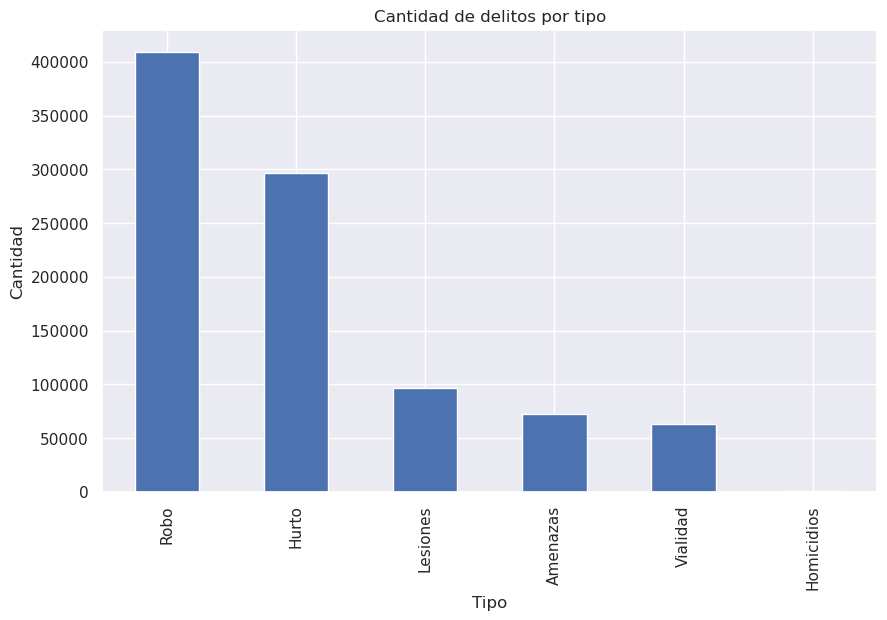

In [242]:
# Obtenemos la cantidad de delitos por tipo
value_counts = delitos_df['tipo'].value_counts()

# Graficamos
plt.figure(figsize=(10, 6))
value_counts.plot(kind='bar')
plt.xlabel('Tipo')
plt.ylabel('Cantidad')
plt.title('Cantidad de delitos por tipo')
plt.show()

In [243]:
print(f"Subtipos de delito:\n{delitos_df['subtipo'].unique()}")

Subtipos de delito:
['Robo total' 'Robo automotor' 'Hurto automotor' 'Hurto total'
 'Lesiones por siniestros viales' 'Homicidios dolosos' 'Femicidios'
 'Amenazas' 'Lesiones Dolosas' 'Muertes por siniestros viales']


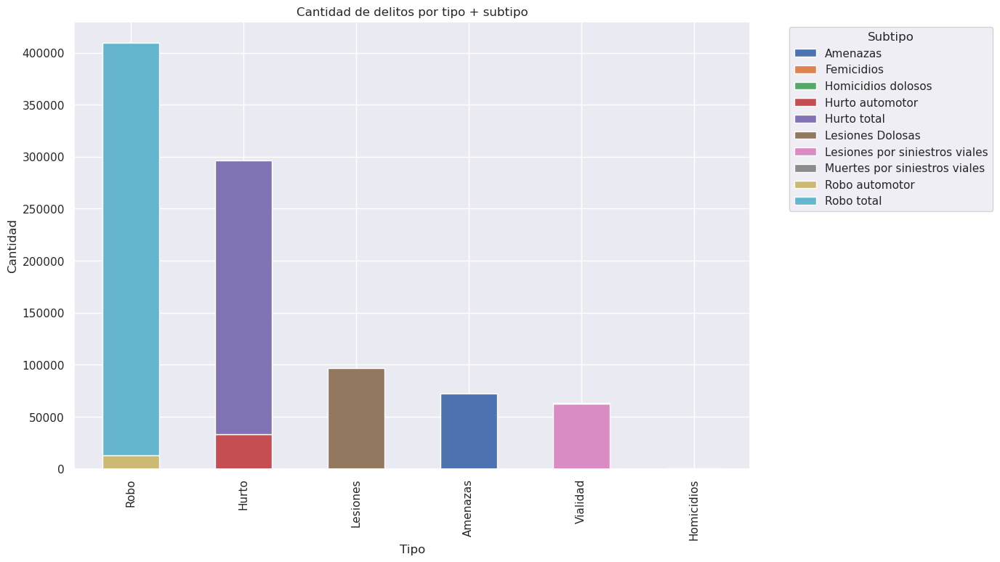

In [244]:
# Agrupamos por tipo + subtipo
grouped_counts = delitos_df.groupby(['tipo', 'subtipo']).size().unstack()

# Ordenamos por tipo
sorted_grouped_counts = grouped_counts.reindex(delitos_df['tipo'].value_counts().index)

# Graficamos
sorted_grouped_counts.plot(kind='bar', stacked=True, figsize=(12, 8))
plt.xlabel('Tipo')
plt.ylabel('Cantidad')
plt.title(f'Cantidad de delitos por tipo + subtipo')
plt.legend(title='Subtipo', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## 3. Feature engineering

Predicción de robos según el clima:

- Siendo la categoría con más cantidad de ocurrencias, nos enfocaremos en la predicción de robos totales únicamente:

In [245]:
robos_df = delitos_df[delitos_df['tipo'] == "Robo"]
robos_df = robos_df[robos_df['subtipo'] == "Robo total"]

Primero necesitamos estandarizar la columna de fecha, para así poder luego juntar ambos datasets según fecha:

- En el dataset de clima la fecha tiene el siguiente formato: 2015-01-01 03:00:00+00:00
- En el dataset de robos tenemos la fecha y la franja horaria, en columnas diferentes, con los siguientes formatos respectivamente: 2016-01-26 y 21.0

In [246]:
##### Robos #####

# Copiamos el dataset original
robos_df_clean = robos_df.copy()

# Eliminamos las filas que no tienen fecha o franja
robos_df_clean = robos_df_clean.dropna(subset=['fecha', 'franja'])

# Convertimos la columna de fecha al formato datetime
robos_df_clean['fecha'] = pd.to_datetime(robos_df_clean['fecha'], format='%Y-%m-%d')

# Convertimos la columna de franja a string y le damos el formato correcto
robos_df_clean['franja'] = robos_df_clean['franja'].astype(int).astype(str).str.zfill(2) + ':00:00'

# Combinamos fecha y franja en una sola columna
robos_df_clean['date'] = pd.to_datetime(robos_df_clean['fecha'].astype(str) + ' ' + robos_df_clean['franja'], format='%Y-%m-%d %H:%M:%S')


##### Clima #####

# Copiamos el dataset original
clima_df_clean = clima_df.copy()

# Convertimos a formato datetime
clima_df_clean['date'] = pd.to_datetime(clima_df_clean['date'])

# Quitamos la zona horaria
clima_df_clean['date'] = clima_df_clean['date'].dt.tz_localize(None)


print("Robos:")
print(f"Fecha inicio: {robos_df_clean['date'].min()}")
print(f"Fecha fin: {robos_df_clean['date'].max()}")
print()
print("Clima:")
print(f"Fecha inicio: {clima_df_clean['date'].min()}")
print(f"Fecha fin: {clima_df_clean['date'].max()}")


Robos:
Fecha inicio: 2016-01-01 00:00:00
Fecha fin: 2022-12-31 23:00:00

Clima:
Fecha inicio: 2015-01-01 03:00:00
Fecha fin: 2024-01-01 02:00:00


Aquí observamos que no necesitamos los registros de clima de 2015, 2023 y 2024, ya que no contamos con información de los delitos en esos años:

In [247]:
years_to_remove = [2015, 2023, 2024]
clima_df_clean = clima_df_clean[~clima_df_clean['date'].dt.year.isin(years_to_remove)]

print("Robos:")
print(f"Fecha inicio: {robos_df_clean['date'].min()}")
print(f"Fecha fin: {robos_df_clean['date'].max()}")
print()
print("Clima:")
print(f"Fecha inicio: {clima_df_clean['date'].min()}")
print(f"Fecha fin: {clima_df_clean['date'].max()}")

Robos:
Fecha inicio: 2016-01-01 00:00:00
Fecha fin: 2022-12-31 23:00:00

Clima:
Fecha inicio: 2016-01-01 00:00:00
Fecha fin: 2022-12-31 23:00:00


Ahora procedemos a eliminar las columnas que no necesitamos del dataset de delitos (sólo nos interesan la columna construida de fecha y hora y la cantidad de robos)

In [248]:
robos_df_clean_ = robos_df_clean.copy() # Será utilizado para pruebas al final
robos_df_clean.drop(columns=['id-mapa', 'anio', 'mes', 'dia', 'fecha', 'franja', 'barrio', 'comuna', 'latitud', 'longitud', 'tipo', 'subtipo', 'uso_arma', 'uso_moto'], inplace=True)

robos_df_clean

,cantidad,date
0,1,2016-01-26 21:00:00
1,1,2016-01-20 16:00:00
2,1,2016-01-03 13:00:00
3,1,2016-01-09 17:00:00
4,1,2016-01-25 18:00:00
...,...,...
909398,1,2022-12-30 00:00:00
909399,1,2022-01-05 02:00:00
909400,1,2022-01-21 01:00:00
909401,1,2022-01-21 04:00:00


In [249]:
robos_df_clean.describe()

,cantidad
count,395052.0
mean,1.0
std,0.0
min,1.0
25%,1.0
50%,1.0
75%,1.0
max,1.0


Observamos que la cantidad siempre es 1 (no están sumados los robos que ocurren el mismo dia en la misma franja horaria).

Procedemos a agrupar por fecha y hora, sumando la cantidad de robos:

In [250]:
robos_df_clean = robos_df_clean.groupby('date', as_index=False).agg({'cantidad': 'sum'})

robos_df_clean

,date,cantidad
0,2016-01-01 00:00:00,4
1,2016-01-01 01:00:00,8
2,2016-01-01 02:00:00,2
3,2016-01-01 03:00:00,7
4,2016-01-01 04:00:00,8
...,...,...
59475,2022-12-31 19:00:00,4
59476,2022-12-31 20:00:00,3
59477,2022-12-31 21:00:00,6
59478,2022-12-31 22:00:00,1


In [251]:
robos_df_clean.describe()

,cantidad
count,59480.000000
mean,6.641762
std,4.813960
min,1.000000
25%,3.000000
50%,6.000000
75%,9.000000
max,159.000000


Finalmente juntamos ambos datasets por fecha y hora:

In [252]:
# Hacemos un left join para mantener los datos de clima en el caso en que no haya delitos para un día y hora específicos
dataset_final = pd.merge(clima_df_clean, robos_df_clean, on='date', how='left')

# En el caso que haya valores vacíos para la cantidad de delitos, asignamos un cero
dataset_final['cantidad'] = dataset_final['cantidad'].fillna(0)

# Renombramos la columna que corresponde a la cantidad de robos
dataset_final.rename(columns={'cantidad': 'cantidad_robos'}, inplace=True)

# Una vez realizado el join, ya no necesitamos la columna de fecha
dataset_final.drop(columns=['date'], inplace=True)

dataset_final

,temperature_2m,relative_humidity_2m,dew_point_2m,apparent_temperature,precipitation,rain,weather_code,pressure_msl,surface_pressure,cloud_cover,cloud_cover_low,cloud_cover_mid,cloud_cover_high,wind_speed_10m,wind_direction_10m,wind_gusts_10m,is_day,sunshine_duration,cantidad_robos
0,24.7915,76.085710,20.291500,25.745886,0.0,0.0,3.0,1009.6,1007.28790,81.300000,5.0,85.0,86.0,20.948164,109.057800,35.640000,0.0,0.00000,4.0
1,24.2915,78.396080,20.291500,25.263180,0.0,0.0,3.0,1009.8,1007.48370,83.700000,4.0,97.0,73.0,20.833395,108.121956,35.640000,0.0,0.00000,8.0
2,24.0915,79.342250,20.291500,25.185604,0.0,0.0,3.0,1010.6,1008.28033,82.500000,4.0,85.0,93.0,19.995400,103.535870,34.560000,0.0,0.00000,2.0
3,24.0915,79.587620,20.341500,25.632427,0.0,0.0,3.0,1011.4,1009.07850,91.200005,6.0,94.0,98.0,17.106628,98.471060,31.680000,0.0,0.00000,7.0
4,24.1415,79.594480,20.391500,26.049568,0.0,0.0,2.0,1011.3,1008.97894,67.200000,0.0,75.0,74.0,14.764389,91.397150,27.359999,0.0,0.00000,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61363,26.0045,49.756638,14.704500,23.811047,0.0,0.0,0.0,1012.5,1010.19050,14.400001,0.0,0.0,48.0,34.292713,94.214096,59.760000,1.0,3600.00000,4.0
61364,25.3545,50.393913,14.304501,22.062008,0.0,0.0,1.0,1012.0,1009.68680,29.700000,0.0,0.0,99.0,36.007200,101.534590,61.199997,1.0,3600.00000,3.0
61365,24.5545,54.590622,14.804501,20.964682,0.0,0.0,1.0,1011.4,1009.08200,29.700000,0.0,0.0,99.0,35.538033,103.473175,62.279995,1.0,3600.00000,6.0
61366,23.4545,60.807377,15.454500,20.250326,0.0,0.0,1.0,1011.7,1009.37280,30.000002,0.0,0.0,100.0,34.608715,108.811980,60.120003,1.0,3600.00000,1.0


In [253]:
dataset_final.describe()

,temperature_2m,relative_humidity_2m,dew_point_2m,apparent_temperature,precipitation,rain,weather_code,pressure_msl,surface_pressure,cloud_cover,cloud_cover_low,cloud_cover_mid,cloud_cover_high,wind_speed_10m,wind_direction_10m,wind_gusts_10m,is_day,sunshine_duration,cantidad_robos
count,61368.000000,61368.000000,61368.000000,61368.000000,61368.000000,61368.000000,61368.000000,61368.000000,61368.000000,61368.000000,61368.000000,61368.000000,61368.000000,61368.000000,61368.000000,61368.000000,61368.000000,61368.000000,61368.000000
mean,17.412988,73.361180,12.179419,16.190363,0.112335,0.112332,6.461723,1015.854869,1013.468214,31.575308,17.181381,17.248973,30.681202,16.247591,155.372641,29.634819,0.506583,1388.183210,6.437427
std,6.118497,15.417585,5.559977,7.880352,0.660744,0.660744,16.601931,6.327691,6.283516,35.038131,32.376433,30.353009,40.583240,6.973239,104.129672,11.710640,0.499961,1695.660212,4.876131
min,-0.745500,17.764290,-7.095500,-4.590961,0.000000,0.000000,0.000000,993.600000,991.238200,0.000000,0.000000,0.000000,0.000000,0.000000,0.572935,1.800000,0.000000,0.000000,0.000000
25%,12.754500,63.759145,8.204500,10.097640,0.000000,0.000000,0.000000,1011.400000,1009.048400,0.000000,0.000000,0.000000,0.000000,11.183201,70.253075,21.240000,0.000000,0.000000,3.000000
50%,17.404501,75.536210,12.404500,15.990170,0.000000,0.000000,1.000000,1015.600000,1013.217960,19.800001,0.000000,0.000000,0.000000,15.617529,135.000100,28.800000,1.000000,0.000000,6.000000
75%,21.963750,85.332930,16.404501,22.147004,0.000000,0.000000,2.000000,1020.100000,1017.663150,54.600000,14.000000,21.000000,76.000000,20.683560,233.130020,37.079998,1.000000,3600.000000,9.000000
max,38.854500,100.000000,26.254500,41.186527,29.000000,29.000000,71.000000,1037.300000,1034.749400,100.000000,100.000000,100.000000,100.000000,52.767944,360.000000,95.760000,1.000000,3600.000000,159.000000


Las columnas `is_day` y `weather_code` son variables categóricas. Sin embargo vemos que ya están encodeadas numéricamente, por lo cual no es necesario mayor tratamiento.

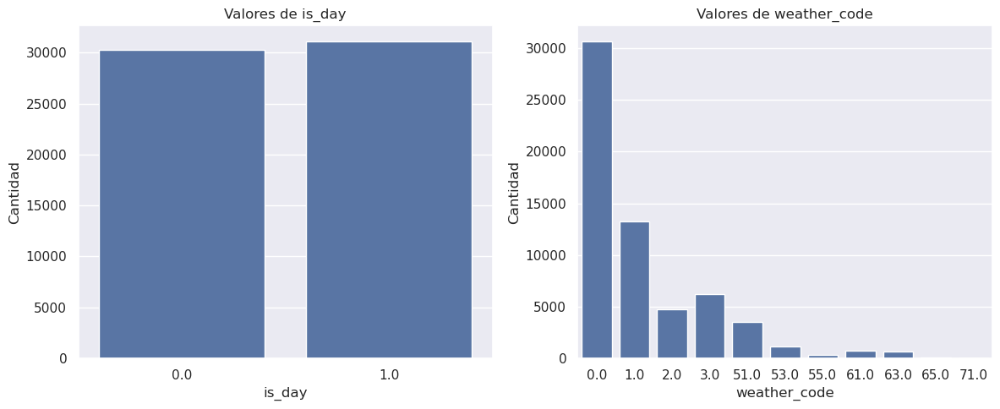

In [254]:
categorical_features = ['is_day', 'weather_code']

# Graficamos los valores de las variables categoricas
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
for i, column in enumerate(categorical_features):
    value_counts = dataset_final[column].value_counts()
    sns.barplot(x=value_counts.index, y=value_counts.values, ax=axes[i])
    axes[i].set_title(f'Valores de {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Cantidad')

plt.tight_layout()
plt.show()

Analizamos la correlación entre los atributos (excluyendo las variables categóricas) y los atributos con el target.

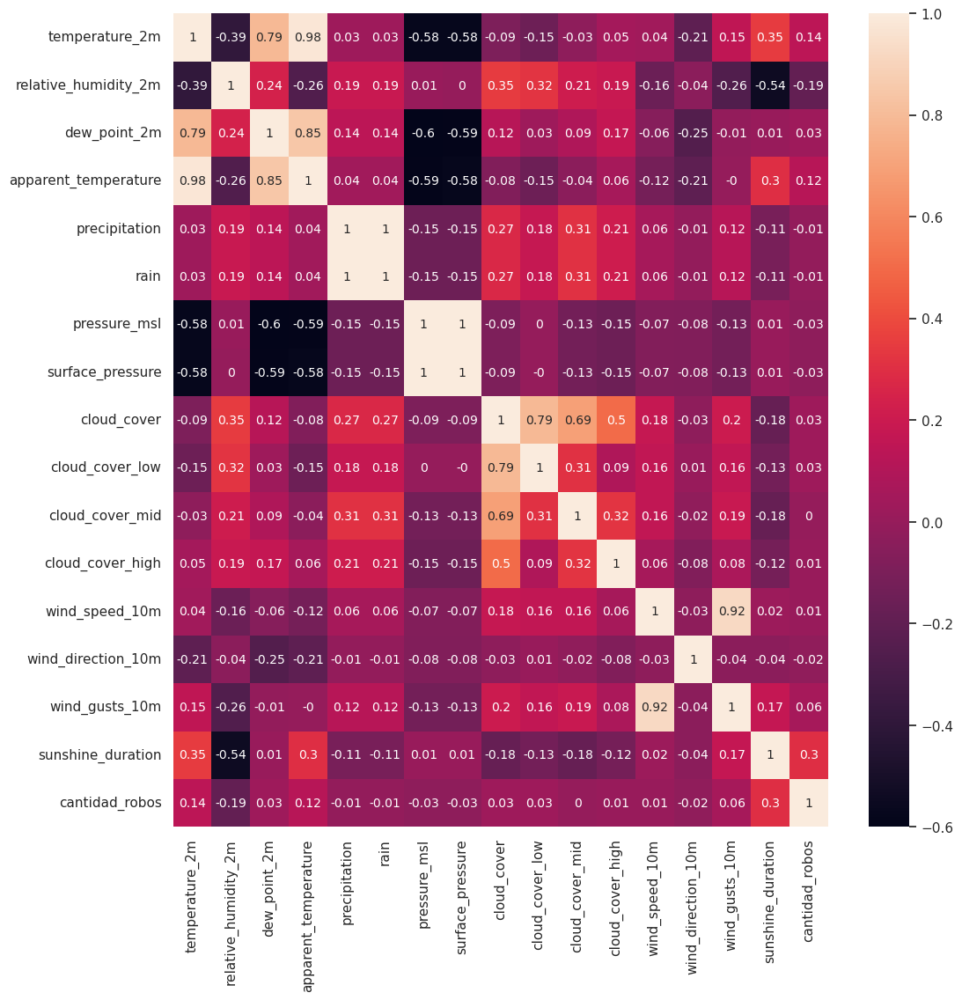

In [255]:
correlation = dataset_final.drop(columns=categorical_features).corr(numeric_only=True).round(2)
plt.figure(figsize=(12, 12))
sns.heatmap(data=correlation, annot=True, annot_kws={"size": 10})
plt.show()

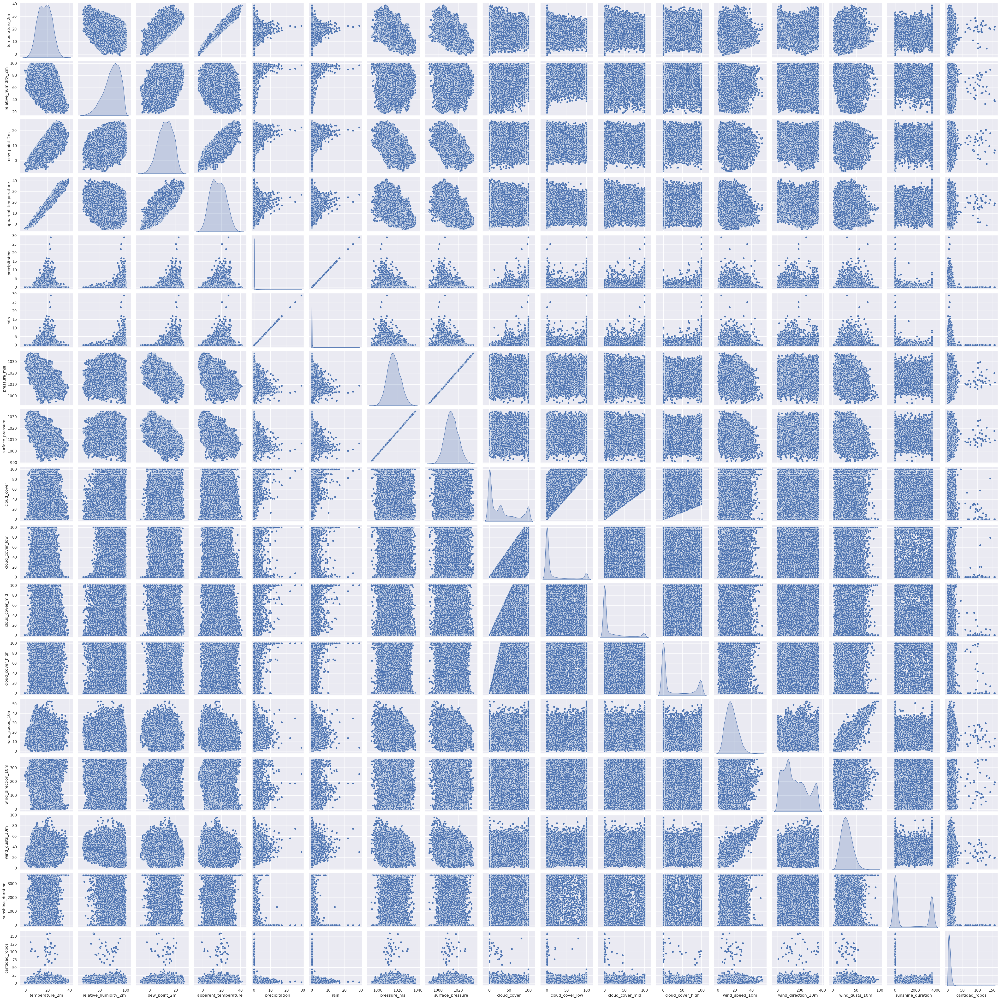

In [256]:
sns.pairplot(data=dataset_final.drop(columns=categorical_features), diag_kind="kde")

Observamos que hay una correlación de 1 (o casi 1) entre las siguientes variables:
- `temperature_2m` y `apparent_temperature`
- `precipitation` y `rain`
- `pressure_msl` y `surface_pressure`
- `wind_gusts_10m` y `wind_speed_10m`

Por lo cual consideramos que están aportando la misma información y procedemos a eliminar las columnas redundantes

In [257]:
dataset_final.drop(columns=['temperature_2m', 'precipitation', 'pressure_msl', 'wind_gusts_10m'], inplace=True)

Por otra parte, observemos la distribución de la variable de interés que queremos predecir (cantidad de robos):

<AxesSubplot: >

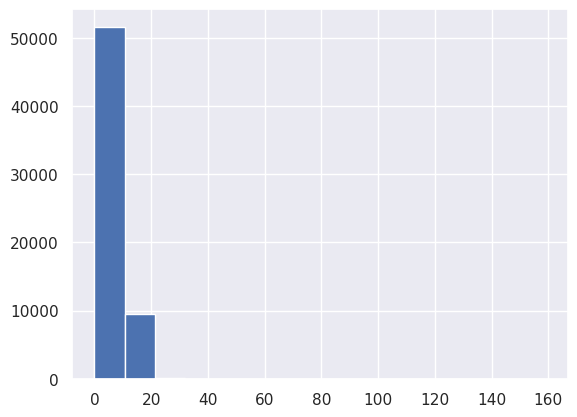

In [258]:
dataset_final["cantidad_robos"].hist(bins=15)

Ahora tratemos intentaremos aplicando logaritmo para obtener una distribución más parecida a una normal:

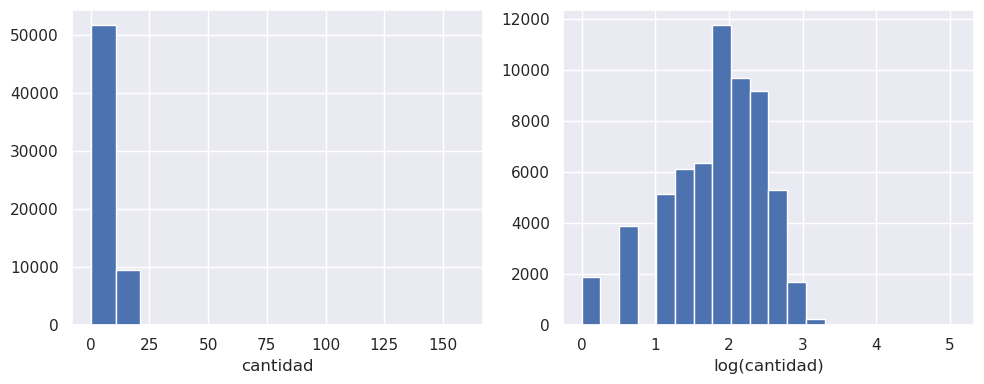

In [259]:
# Aplico feature engineering, modificando el target por el logaritmo
dataset_final["cantidad_robos_log"] = np.log(dataset_final["cantidad_robos"]+1)

f, ax = plt.subplots(1,2, figsize=(10, 4))
dataset_final["cantidad_robos"].hist(ax=ax[0], bins=15)
dataset_final["cantidad_robos_log"].hist(ax=ax[1], bins=20)

ax[0].set_xlabel("cantidad")
ax[1].set_xlabel("log(cantidad)")
plt.tight_layout()

Por lo tanto durante el trabajo de entrenamiento y selección de modelos utilizaremos "cantidad_robos_log" envés de "cantidad_robos"

## Métricas y funciones auxiliares

Vamos a crear funciones para obtener métricas más rápidamente al probar distintos modelos. Se utilizarán las siguientes métricas:

- MAE
- MSE
- RMSE
- R2

Por otro lado definimos una métrica propia:
- Nos interesa saber para ciertas condiciones climáticas dadas qué cantidad de robos tendremos.
- Queremos saber qué tan cerca está el valor predicho por el modelo VS el valor real
- La métrica propia definirá que el modelo acertó si al predecir la cantidad de robos el valor predicho está dentro de un margen de tolerancia:
    - Por ejemplo: ±2 robos
- Por lo tanto definimos:
    - Error: La diferencia entre el valor real y el predicho
    - Precisión: cuantos aciertos se tienen, de manera porcentual, sobre el set de testeo

Función para calcular métricas

In [260]:
#Funcion auxiliar para obtener métricas y comparar más fácilmente cada modelo
def obtener_metricas(df, nombre_modelo, y_test,y_predicted,tolerancia=2,unlog=True,display_results=True,replace_result=False):
    """Funcion auxiliar para obtener métricas y comparar más fácilmente cada modelo."""

    # Calculamos error del modelo (MAE,MSE,R2,etc)
    mae = mean_absolute_error(y_test, y_predicted)
    mape = mean_absolute_percentage_error(y_test, y_predicted)
    mse = mean_squared_error(y_test, y_predicted)
    r2 = r2_score(y_test, y_predicted)

    metricas = {
        "Modelo": nombre_modelo,
        "MAE": mae,
        "MSE": mse,
        "RMSE": np.sqrt(mse),
        # "MAPE": mape,    
        "R2": r2,
    }

    # Creamos dataframe que se usará para graficar
    if unlog:
            y_test_ = np.exp(y_test)
            y_predicted_ = np.exp(y_predicted)
            
    df_comparacion = pd.DataFrame({
        'Actual': y_test_,
        'Predicted': np.round(y_predicted_),
    })

    df_comparacion['Muestra'] = df_comparacion.index
    df_comparacion['Error'] = df_comparacion['Actual']-df_comparacion['Predicted']
    df_comparacion["Acierto"] = 0
    df_comparacion.loc[abs(df_comparacion['Error'])<=tolerancia,"Acierto"] = 1
    correctos = len(df_comparacion[df_comparacion["Acierto"]==1])
    total = len(df_comparacion)
    precision = correctos/total

    #Agregamos precision al dataframe de métricas
    metricas['Precision'] = precision

    #Creamos dataframe con las métricas. Si ya existe un dataset con métricas y se le pasa a la funcion, concatena resultados
    df_result = pd.DataFrame([metricas])

    if df is None:
        final_df = df_result
    elif (not replace_result):
        final_df = pd.concat([df,df_result],ignore_index=True)
    else:
        df.loc[df["Modelo"]==nombre_modelo] = df_result
        final_df = df
    #Muestra de resultados (opcional)
    if display_results:    
        display(final_df)

    #Retornamos dataframe de resultados y el dataframe de comparacion (que se usará para graficar)
    return final_df,df_comparacion


Función para graficar resultados predichos VS actuales

In [261]:
def graficar_precision_modelo(df_comparacion,modelo,tolerancia=2,cant_muestras=50,inicio_muestra=0):
    """Funcion auxiliar para comparar y_test con y_predicted de manera grafica"""

    #Para que el gráfico sea más visible nos quedamos solo con un cierto numero de muestras
    final_muestras = inicio_muestra+cant_muestras   
    df_comparacion = df_comparacion.iloc[inicio_muestra:final_muestras,:]

    #Muestro algunos resultados en un dataframe
    display(df_comparacion.drop(columns=["Muestra"]).head(10))

    #Obtengo algunos datos para mostrar como subtitulo del grafico
    correctos = len(df_comparacion[df_comparacion["Acierto"]==1])
    total = len(df_comparacion)
    precision = correctos/total

    #Graficamos
    fig = px.scatter(df_comparacion, x='Muestra', y=['Actual', 'Predicted'])
    fig.add_bar(x=df_comparacion['Muestra'], y=df_comparacion['Error'], name='Error')
    fig.update_layout(title_text=f"Robos predichos VS actuales. Modelo: {modelo}. Muestras graficadas: {cant_muestras}")
        
    # Subtitulo con cantidad de predicciones correctas
    fig.add_annotation(
        xref='paper', yref='paper', x=0.5, y=1.0, xanchor='center', yanchor='top',
        text=f"Cantidad de predicciones dentro del margen (±{tolerancia} robos): {correctos}/{total} ({precision*100:.2f}%)",
        showarrow=False,
        font=dict(size=12) 
    )
    fig.update_layout(
        margin=dict(t=100)  # Incrementamos margen
    )
    fig.update_traces(marker_color='blue', selector=dict(type='scatter', name='Actual'))
    fig.update_traces(line_color='red', selector=dict(type='scatter', name='Predicted'))
    fig.update_traces(marker_color=df_comparacion['Error'], marker_colorscale='RdBu', selector=dict(type='bar'))
    fig.update_xaxes(showgrid=True)
    fig.update_yaxes(showgrid=True,title_text="Cantidad de robos")
    # fig.update_traces(hovertemplate='Calories: %{y:.2f}<br>Error: %{customdata[1]}<br>Item: %{customdata[0]}', selector=dict(type='scatter')) 
    fig.show()

## 4. Definición de un baseline

Vamos a analizar el uso de una métrica basada en si es de día o noche y si llueve o no.

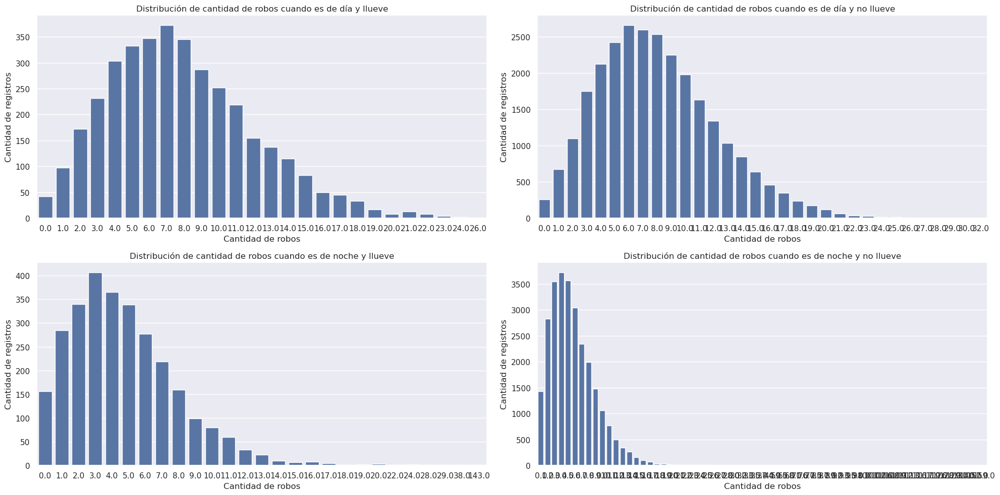

In [262]:
is_day = dataset_final[dataset_final['is_day']==1]
is_night = dataset_final[dataset_final['is_day']==0]

is_day_and_rain = is_day[is_day['rain']>0]
is_day_and_no_rain = is_day[is_day['rain']==0]
is_night_and_rain = is_night[is_night['rain']>0]
is_night_and_no_rain = is_night[is_night['rain']==0]

fig, axes = plt.subplots(2, 2, figsize=(20, 10))

value_counts = is_day_and_rain['cantidad_robos'].value_counts()
sns.barplot(x=value_counts.index, y=value_counts.values, ax=axes[0][0])
axes[0][0].set_title(f'Distribución de cantidad de robos cuando es de día y llueve')
axes[0][0].set_xlabel('Cantidad de robos')
axes[0][0].set_ylabel('Cantidad de registros')

value_counts = is_day_and_no_rain['cantidad_robos'].value_counts()
sns.barplot(x=value_counts.index, y=value_counts.values, ax=axes[0][1])
axes[0][1].set_title(f'Distribución de cantidad de robos cuando es de día y no llueve')
axes[0][1].set_xlabel('Cantidad de robos')
axes[0][1].set_ylabel('Cantidad de registros')

value_counts = is_night_and_rain['cantidad_robos'].value_counts()
sns.barplot(x=value_counts.index, y=value_counts.values, ax=axes[1][0])
axes[1][0].set_title(f'Distribución de cantidad de robos cuando es de noche y llueve')
axes[1][0].set_xlabel('Cantidad de robos')
axes[1][0].set_ylabel('Cantidad de registros')

value_counts = is_night_and_no_rain['cantidad_robos'].value_counts()
sns.barplot(x=value_counts.index, y=value_counts.values, ax=axes[1][1])
axes[1][1].set_title(f'Distribución de cantidad de robos cuando es de noche y no llueve')
axes[1][1].set_xlabel('Cantidad de robos')
axes[1][1].set_ylabel('Cantidad de registros')

plt.tight_layout()
plt.show()

Dado los gráficos obtenidos, vamos a utilizar una heurística inicial donde diremos que:
- Si es de día, la cantidad de robos es 7
- Si es de noche, la cantidad de robos es 3

In [263]:
def predict_baseline(dataset):
    predictions = dataset['is_day'].apply(lambda x: 7.0 if x == 1 else 3.0) 
    return predictions

Con la heurística inicial obtenemos estas métricas:

In [264]:
y_predicted = predict_baseline(dataset_final)

dataframe_metricas,_ = obtener_metricas(None, "Heuristica", dataset_final["cantidad_robos"],y_predicted)

,Modelo,MAE,MSE,RMSE,R2,Precision
0,Heuristica,3.097119,23.421262,4.839552,0.014931,0.11581


### 5. Selección y entrenamiento de modelos

Separamos entre características (features) y variable a predecir (target)

In [265]:
X = dataset_final.drop(columns=['cantidad_robos','cantidad_robos_log'])
y = dataset_final['cantidad_robos_log']

Separamos el dataset en 70% train y 30% test

In [266]:
# Se separa el dataset en entrenamiento y evaluación
X_train, X_test, y_train, y_test = train_test_split(X,  y, test_size=0.3, random_state=42)

print("Cantidad de muestras usadas para entrenar:",y_train.size)
print("Cantidad de muestras usadas para testear:",y_test.size)

Cantidad de muestras usadas para entrenar: 42957
Cantidad de muestras usadas para testear: 18411


Escalamos los datos

In [267]:
# Escalemos los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## 5. Prueba de modelos

- Se evaluarán distintos modelos para predecir la cantidad de robos dadas ciertas condiciones climáticas. 
- Se hará una comparación con diferentes métricas de cada modelo
- Se seleccionará el mejor modelo para presentar resultados y conclusiones
- Los modelos a evaluar son:
    - Baseline / Heurística propia
    - Regresión Lineal.
    - Regresión Lineal con regularización de Ridge.
    - SVR
    - Árbol de decisión
    - Bosques
    - AdaBoost
    - XGBoost



### 5.1. Regresión lineal

In [268]:
regresion = LinearRegression()
regresion.fit(X_train_scaled, y_train)

y_predicted = regresion.predict(X_test_scaled)
dataframe_metricas,dataframe_comparacion_grafica = obtener_metricas(dataframe_metricas, "Regresion Lineal", y_test,y_predicted,tolerancia=2)

,Modelo,MAE,MSE,RMSE,R2,Precision
0,Heuristica,3.097119,23.421262,4.839552,0.014931,0.115810
1,Regresion Lineal,0.459236,0.347714,0.589673,0.166044,0.471023


> Se observa una mejora de R2 por sobre el baseline: 0.166 > 0.015. La precisión mejoró de 11% a 47%

> La precisión en este caso se refiere a qué cantidad porcentaje de los robos predichos se acerca a los robos reales ±2 robos

Visualización de datos predichos VS datos actuales

In [269]:
graficar_precision_modelo(dataframe_comparacion_grafica,"Regresion Lineal")

,Actual,Predicted,Error,Acierto
55895,9.0,5.0,4.0,0
7225,4.0,5.0,-1.0,1
58186,6.0,5.0,1.0,1
52730,3.0,5.0,-2.0,1
37898,1.0,5.0,-4.0,0
40407,5.0,8.0,-3.0,0
24482,4.0,5.0,-1.0,1
4894,16.0,5.0,11.0,0
34083,1.0,5.0,-4.0,0
31172,10.0,8.0,2.0,0


### 5.2 Regresión de Ridge:

In [270]:
ridge = Ridge()

grid = GridSearchCV(ridge,
                    {"alpha": np.linspace(0, 20, 1000)},
                    refit=True,
                    cv=5,
                    scoring='neg_mean_absolute_error')

grid.fit(X_train_scaled,y_train)

ridge_best = grid.best_estimator_

In [271]:
y_predicted = ridge_best.predict(X_test_scaled)
dataframe_metricas,dataframe_comparacion_grafica = obtener_metricas(dataframe_metricas, "Ridge", y_test,y_predicted,tolerancia=2)
graficar_precision_modelo(dataframe_comparacion_grafica,"Regresion lineal con regularizacion de Ridge")

,Modelo,MAE,MSE,RMSE,R2,Precision
0,Heuristica,3.097119,23.421262,4.839552,0.014931,0.115810
1,Regresion Lineal,0.459236,0.347714,0.589673,0.166044,0.471023
2,Ridge,0.459236,0.347714,0.589673,0.166044,0.471023


,Actual,Predicted,Error,Acierto
55895,9.0,5.0,4.0,0
7225,4.0,5.0,-1.0,1
58186,6.0,5.0,1.0,1
52730,3.0,5.0,-2.0,1
37898,1.0,5.0,-4.0,0
40407,5.0,8.0,-3.0,0
24482,4.0,5.0,-1.0,1
4894,16.0,5.0,11.0,0
34083,1.0,5.0,-4.0,0
31172,10.0,8.0,2.0,0


### 5.3 SVR

En pruebas sueltas que hemos hecho vimos que se tarda mucho al querer buscar los mejores hiperparámetros mediante gridsearch.
Por eso, tomaremos un subset de entrenamiento para realizar esta búsqueda. Tomemos por ejemplo 4000 muestras

In [272]:
# Generamos un subset de entrenamiento para que no tarde tanto en entrenar el modelo
train = pd.merge(pd.DataFrame(X_train_scaled), pd.DataFrame(y_train), left_index=True, right_index=True)
train_subsample = train.sample(n=4000, random_state=42)

X_train_subsample = train_subsample.drop(columns=['cantidad_robos_log'])
y_train_subsample = train_subsample['cantidad_robos_log']

In [273]:
%%time
svmRegressor = SVR()

grid = GridSearchCV(svmRegressor,
                    [{"C": [0.01, 0.1, 1, 5, 10, 100], "kernel": ["linear"]},
                     {"C": [0.01, 0.1, 1, 5, 10, 100], "gamma": [0.1, 0.5, 1, 2, 10, 100], "kernel": ["rbf", "sigmoid"]},
                     {"C": [0.01, 0.1, 1, 5, 10, 100], "degree": [2, 3, 4, 5, 6], "kernel": ["poly"]}],
                    refit=True,
                    cv=3,
                    scoring='neg_mean_absolute_error')

grid.fit(X_train_subsample, y_train_subsample)

CPU times: user 12min 24s, sys: 45 ms, total: 12min 24s
Wall time: 12min 24s


GridSearchCV(cv=3, estimator=SVR(),
             param_grid=[{'C': [0.01, 0.1, 1, 5, 10, 100],
                          'kernel': ['linear']},
                         {'C': [0.01, 0.1, 1, 5, 10, 100],
                          'gamma': [0.1, 0.5, 1, 2, 10, 100],
                          'kernel': ['rbf', 'sigmoid']},
                         {'C': [0.01, 0.1, 1, 5, 10, 100],
                          'degree': [2, 3, 4, 5, 6], 'kernel': ['poly']}],
             scoring='neg_mean_absolute_error')

In [274]:
grid.best_params_

{'C': 0.1, 'gamma': 100, 'kernel': 'rbf'}

Para 4000 observaciones de prueba, los mejores parámetros fueron similares al correrlos con 2000. Podríamos achicar la región de búsqueda y analizar valores de gamma mayores a 100, ya que este es el valor máximo analizado en las corridas anteriores

In [275]:
%%time
svmRegressor = SVR()

grid = GridSearchCV(svmRegressor,
                    [
                        {"C": [0.01, 0.05, 0.1, 0.15], "gamma": [80, 100, 200, 300], "kernel": ["rbf"]},
                    ],
                    refit=True,
                    cv=3,
                    scoring='neg_mean_absolute_error')

grid.fit(X_train_subsample, y_train_subsample)

CPU times: user 26.9 s, sys: 379 µs, total: 26.9 s
Wall time: 27 s


GridSearchCV(cv=3, estimator=SVR(),
             param_grid=[{'C': [0.01, 0.05, 0.1, 0.15],
                          'gamma': [80, 100, 200, 300], 'kernel': ['rbf']}],
             scoring='neg_mean_absolute_error')

In [276]:
grid.best_params_

{'C': 0.15, 'gamma': 300, 'kernel': 'rbf'}

- No probaremos con valores de gamma mayores ya que podríamos empezar a tener problemas de overfitting.
- Nos quedamos con estos parámetros y evaluamos el modelo:

In [277]:
bestSvmRegressor = SVR(**grid.best_params_)
bestSvmRegressor.fit(X_train_scaled, y_train)

SVR(C=0.15, gamma=300)

In [278]:
y_predicted = bestSvmRegressor.predict(X_test_scaled)
dataframe_metricas,dataframe_comparacion_grafica = obtener_metricas(dataframe_metricas, "SVR", y_test,y_predicted,tolerancia=2)
graficar_precision_modelo(dataframe_comparacion_grafica,"SVR")

,Modelo,MAE,MSE,RMSE,R2,Precision
0,Heuristica,3.097119,23.421262,4.839552,0.014931,0.115810
1,Regresion Lineal,0.459236,0.347714,0.589673,0.166044,0.471023
2,Ridge,0.459236,0.347714,0.589673,0.166044,0.471023
3,SVR,0.505728,0.423305,0.650619,-0.015253,0.278149


,Actual,Predicted,Error,Acierto
55895,9.0,7.0,2.0,0
7225,4.0,7.0,-3.0,0
58186,6.0,7.0,-1.0,1
52730,3.0,7.0,-4.0,0
37898,1.0,7.0,-6.0,0
40407,5.0,7.0,-2.0,0
24482,4.0,7.0,-3.0,0
4894,16.0,7.0,9.0,0
34083,1.0,7.0,-6.0,0
31172,10.0,7.0,3.0,0


### 5.4 Regresión con KNN

In [279]:
knnRegressor = KNeighborsRegressor()

hyperparams = {"n_neighbors": np.arange(1, 60, 5),    
               "weights": ["uniform", "distance"], 
               "p": np.arange(1.0, 60.0, 5.0)}          

# Creamos un método de busqueda por grilla
grid = GridSearchCV(knnRegressor,
                    hyperparams,
                    refit=False,
                    cv=3,
                    scoring='neg_mean_absolute_error',
                    n_jobs=-1)

grid.fit(X_train_scaled, y_train)

GridSearchCV(cv=3, estimator=KNeighborsRegressor(), n_jobs=-1,
             param_grid={'n_neighbors': array([ 1,  6, 11, 16, 21, 26, 31, 36, 41, 46, 51, 56]),
                         'p': array([ 1.,  6., 11., 16., 21., 26., 31., 36., 41., 46., 51., 56.]),
                         'weights': ['uniform', 'distance']},
             refit=False, scoring='neg_mean_absolute_error')

In [280]:
#{'n_neighbors': 21, 'p': 1.0, 'weights': 'distance'}
grid.best_params_

{'n_neighbors': 21, 'p': 1.0, 'weights': 'distance'}

In [281]:
bestKnnRegressor = KNeighborsRegressor(**grid.best_params_)
bestKnnRegressor.fit(X_train_scaled, y_train)

KNeighborsRegressor(n_neighbors=21, p=1.0, weights='distance')

In [282]:
y_predicted = bestKnnRegressor.predict(X_test)
dataframe_metricas,dataframe_comparacion_grafica = obtener_metricas(dataframe_metricas, "KNN", y_test,y_predicted,tolerancia=2)
graficar_precision_modelo(dataframe_comparacion_grafica,"KNN")

/home/idk/.local/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning:

X has feature names, but KNeighborsRegressor was fitted without feature names



,Modelo,MAE,MSE,RMSE,R2,Precision
0,Heuristica,3.097119,23.421262,4.839552,0.014931,0.115810
1,Regresion Lineal,0.459236,0.347714,0.589673,0.166044,0.471023
2,Ridge,0.459236,0.347714,0.589673,0.166044,0.471023
3,SVR,0.505728,0.423305,0.650619,-0.015253,0.278149
4,KNN,0.488525,0.405787,0.637014,0.026763,0.403292


,Actual,Predicted,Error,Acierto
55895,9.0,5.0,4.0,0
7225,4.0,6.0,-2.0,1
58186,6.0,7.0,-1.0,1
52730,3.0,6.0,-3.0,0
37898,1.0,5.0,-4.0,0
40407,5.0,8.0,-3.0,0
24482,4.0,6.0,-2.0,1
4894,16.0,7.0,9.0,0
34083,1.0,7.0,-6.0,0
31172,10.0,8.0,2.0,0


### 5.4 Decision Tree

In [283]:
treeRegressor = DecisionTreeRegressor(criterion='squared_error', 
                                      splitter='best',
                                      max_depth=None, 
                                      min_samples_split=2, 
                                      min_samples_leaf=1,
                                      random_state=42)

treeRegressor.fit(X_train, y_train)

DecisionTreeRegressor(random_state=42)

In [284]:
y_predicted = treeRegressor.predict(X_test)
dataframe_metricas_arbol,_ = obtener_metricas(None, "Arbol decision", y_test,y_predicted,tolerancia=2)

,Modelo,MAE,MSE,RMSE,R2,Precision
0,Arbol decision,0.615479,0.650604,0.8066,-0.560405,0.377818


El modelo esta sobreajustando en train, buscamos un valor de ccp_alpha para podar el arbol

In [285]:
# Busqueda de hiperpatametro ccp_alpha para podar el arbol
grid = GridSearchCV(treeRegressor,
                    {'ccp_alpha': np.linspace(0, 0.5, 100)},
                    refit=False,
                    cv=3,
                    scoring='neg_mean_absolute_error',
                    n_jobs=-1)

grid.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=DecisionTreeRegressor(random_state=42), n_jobs=-1,
             param_grid={'ccp_alpha': array([0.        , 0.00505051, 0.01010101, 0.01515152, 0.02020202,
       0.02525253, 0.03030303, 0.03535354, 0.04040404, 0.04545455,
       0.05050505, 0.05555556, 0.06060606, 0.06565657, 0.07070707,
       0.07575758, 0.08080808, 0.08585859, 0.09090909, 0.0959596 ,
       0.1010101 , 0.10606061, 0.11111111...
       0.35353535, 0.35858586, 0.36363636, 0.36868687, 0.37373737,
       0.37878788, 0.38383838, 0.38888889, 0.39393939, 0.3989899 ,
       0.4040404 , 0.40909091, 0.41414141, 0.41919192, 0.42424242,
       0.42929293, 0.43434343, 0.43939394, 0.44444444, 0.44949495,
       0.45454545, 0.45959596, 0.46464646, 0.46969697, 0.47474747,
       0.47979798, 0.48484848, 0.48989899, 0.49494949, 0.5       ])},
             refit=False, scoring='neg_mean_absolute_error')

In [286]:
grid.best_params_

{'ccp_alpha': 0.005050505050505051}

In [287]:
bestTreeRegressor = DecisionTreeRegressor(**grid.best_params_)
bestTreeRegressor.fit(X_train, y_train)

DecisionTreeRegressor(ccp_alpha=0.005050505050505051)

In [288]:
y_predicted = bestTreeRegressor.predict(X_test)
dataframe_metricas,dataframe_comparacion_grafica = obtener_metricas(dataframe_metricas, "Arbol decision", y_test,y_predicted,tolerancia=2)
graficar_precision_modelo(dataframe_comparacion_grafica,"Árbol de decisión")

,Modelo,MAE,MSE,RMSE,R2,Precision
0,Heuristica,3.097119,23.421262,4.839552,0.014931,0.115810
1,Regresion Lineal,0.459236,0.347714,0.589673,0.166044,0.471023
2,Ridge,0.459236,0.347714,0.589673,0.166044,0.471023
3,SVR,0.505728,0.423305,0.650619,-0.015253,0.278149
4,KNN,0.488525,0.405787,0.637014,0.026763,0.403292
5,Arbol decision,0.463221,0.352669,0.593859,0.154161,0.480311


,Actual,Predicted,Error,Acierto
55895,9.0,5.0,4.0,0
7225,4.0,5.0,-1.0,1
58186,6.0,5.0,1.0,1
52730,3.0,5.0,-2.0,1
37898,1.0,5.0,-4.0,0
40407,5.0,8.0,-3.0,0
24482,4.0,5.0,-1.0,1
4894,16.0,5.0,11.0,0
34083,1.0,5.0,-4.0,0
31172,10.0,8.0,2.0,0


Exportamos el árbol en caso de que quisiéramos verlo gráficamente:

In [289]:
export_graphviz(bestTreeRegressor, out_file = "modelos/treeRegressor.dot",
                feature_names=X.columns.to_list(),
                rounded=True,
                filled=True)

### 5.5 Bosques aleatorios

Probemos ahora si con métodos de ensamble podemos lograr mejores modelos

In [290]:
# Creamos un bosque aleatorio con 50 estimadores y con el ccp_alpha del mejor arbol obtenido anteriormente
rfRegressor = RandomForestRegressor(criterion='squared_error', 
                                    max_depth=None, 
                                    n_estimators=50,
                                    min_samples_split=2, 
                                    min_samples_leaf=1,
                                    random_state=42,
                                    ccp_alpha=0.00505)

rfRegressor.fit(X_train, y_train)


RandomForestRegressor(ccp_alpha=0.00505, n_estimators=50, random_state=42)

In [291]:
y_predicted = rfRegressor.predict(X_test)
dataframe_metricas,dataframe_comparacion_grafica = obtener_metricas(dataframe_metricas, "Bosque Aleatorio", y_test,y_predicted,tolerancia=2,replace_result=False)
graficar_precision_modelo(dataframe_comparacion_grafica,"Bosque Aleatorio")

,Modelo,MAE,MSE,RMSE,R2,Precision
0,Heuristica,3.097119,23.421262,4.839552,0.014931,0.115810
1,Regresion Lineal,0.459236,0.347714,0.589673,0.166044,0.471023
2,Ridge,0.459236,0.347714,0.589673,0.166044,0.471023
3,SVR,0.505728,0.423305,0.650619,-0.015253,0.278149
4,KNN,0.488525,0.405787,0.637014,0.026763,0.403292
5,Arbol decision,0.463221,0.352669,0.593859,0.154161,0.480311
6,Bosque Aleatorio,0.463234,0.352669,0.593860,0.154160,0.480311


,Actual,Predicted,Error,Acierto
55895,9.0,5.0,4.0,0
7225,4.0,5.0,-1.0,1
58186,6.0,5.0,1.0,1
52730,3.0,5.0,-2.0,1
37898,1.0,5.0,-4.0,0
40407,5.0,8.0,-3.0,0
24482,4.0,5.0,-1.0,1
4894,16.0,5.0,11.0,0
34083,1.0,5.0,-4.0,0
31172,10.0,8.0,2.0,0


### 5.6 AdaBoost

In [292]:
base_estimator = DecisionTreeRegressor(max_depth=6)
adaboost_regressor = AdaBoostRegressor(estimator=base_estimator, n_estimators=500, random_state=42, learning_rate=0.01)
#No hace falta escalar features ya que nuestro estimador base es un decision tree
adaboost_regressor.fit(X_train, y_train)

AdaBoostRegressor(estimator=DecisionTreeRegressor(max_depth=6),
                  learning_rate=0.01, n_estimators=500, random_state=42)

In [293]:
y_predicted = adaboost_regressor.predict(X_test)
dataframe_metricas,dataframe_comparacion_grafica = obtener_metricas(dataframe_metricas, "AdaBoost", y_test,y_predicted,tolerancia=2)
graficar_precision_modelo(dataframe_comparacion_grafica,"AdaBoost")

,Modelo,MAE,MSE,RMSE,R2,Precision
0,Heuristica,3.097119,23.421262,4.839552,0.014931,0.115810
1,Regresion Lineal,0.459236,0.347714,0.589673,0.166044,0.471023
2,Ridge,0.459236,0.347714,0.589673,0.166044,0.471023
3,SVR,0.505728,0.423305,0.650619,-0.015253,0.278149
4,KNN,0.488525,0.405787,0.637014,0.026763,0.403292
5,Arbol decision,0.463221,0.352669,0.593859,0.154161,0.480311
6,Bosque Aleatorio,0.463234,0.352669,0.593860,0.154160,0.480311
7,AdaBoost,0.467060,0.348150,0.590042,0.165000,0.473087


,Actual,Predicted,Error,Acierto
55895,9.0,4.0,5.0,0
7225,4.0,4.0,0.0,1
58186,6.0,5.0,1.0,1
52730,3.0,4.0,-1.0,1
37898,1.0,5.0,-4.0,0
40407,5.0,7.0,-2.0,0
24482,4.0,5.0,-1.0,1
4894,16.0,4.0,12.0,0
34083,1.0,5.0,-4.0,0
31172,10.0,7.0,3.0,0


### 5.7 XGBoost

In [294]:
# Inicializamos XGBoost con sus hiperparámetros por defecto
xgb_regressor = xgb.XGBRegressor(objective='reg:squarederror', random_state=42, n_jobs=-1)
xgb_regressor.fit(X_train_scaled, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=-1,
             num_parallel_tree=None, random_state=42, ...)

In [295]:
y_predicted = xgb_regressor.predict(X_test_scaled)
dataframe_metricas,dataframe_comparacion_grafica = obtener_metricas(dataframe_metricas, "XGBoost", y_test,y_predicted,tolerancia=2)
graficar_precision_modelo(dataframe_comparacion_grafica,"XGBoost")

,Modelo,MAE,MSE,RMSE,R2,Precision
0,Heuristica,3.097119,23.421262,4.839552,0.014931,0.115810
1,Regresion Lineal,0.459236,0.347714,0.589673,0.166044,0.471023
2,Ridge,0.459236,0.347714,0.589673,0.166044,0.471023
3,SVR,0.505728,0.423305,0.650619,-0.015253,0.278149
4,KNN,0.488525,0.405787,0.637014,0.026763,0.403292
5,Arbol decision,0.463221,0.352669,0.593859,0.154161,0.480311
6,Bosque Aleatorio,0.463234,0.352669,0.593860,0.154160,0.480311
7,AdaBoost,0.467060,0.348150,0.590042,0.165000,0.473087
8,XGBoost,0.451536,0.337151,0.580647,0.191379,0.482918


,Actual,Predicted,Error,Acierto
55895,9.0,5.0,4.0,0
7225,4.0,5.0,-1.0,1
58186,6.0,4.0,2.0,1
52730,3.0,5.0,-2.0,1
37898,1.0,5.0,-4.0,0
40407,5.0,8.0,-3.0,0
24482,4.0,5.0,-1.0,1
4894,16.0,4.0,12.0,0
34083,1.0,6.0,-5.0,0
31172,10.0,9.0,1.0,1


## 6. Resultados

De la sección anterior obtenemos estos resultados por cada modelo:

In [296]:
dataframe_metricas.sort_values(by=['MAE'], ascending=True)

,Modelo,MAE,MSE,RMSE,R2,Precision
8,XGBoost,0.451536,0.337151,0.580647,0.191379,0.482918
1,Regresion Lineal,0.459236,0.347714,0.589673,0.166044,0.471023
2,Ridge,0.459236,0.347714,0.589673,0.166044,0.471023
5,Arbol decision,0.463221,0.352669,0.593859,0.154161,0.480311
6,Bosque Aleatorio,0.463234,0.352669,0.593860,0.154160,0.480311
7,AdaBoost,0.467060,0.348150,0.590042,0.165000,0.473087
4,KNN,0.488525,0.405787,0.637014,0.026763,0.403292
3,SVR,0.505728,0.423305,0.650619,-0.015253,0.278149
0,Heuristica,3.097119,23.421262,4.839552,0.014931,0.115810


- Vemos que el que mejor performance tiene es el de XGBoost.
- La performance no es muy buena, por lo cuál surgen las siguientes preguntas:
    - ¿Será realmente posible predecir la cantidad de robos en un determinado día conociendo sólo las condiciones climáticas?
    - ¿Qué pasa si ampliamos el margen de tolerancia de ±2 robos?

Para contestar la última pregunta evaluamos qué tan bueno es el modelo de XGBoost si ampliamos el margen:

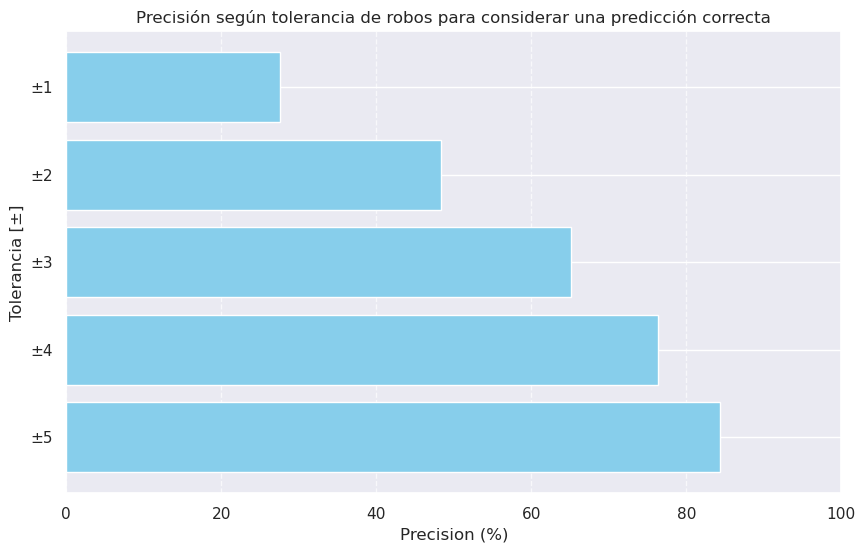

In [297]:
#Obtenemos precisión según tolerancias de 1 a 6 robos
for tol in range(1,6):
    df,_ = obtener_metricas(None, "XGBoost", y_test,y_predicted,tolerancia=tol,replace_result=True,display_results=False)
    data = {
            "Tolerancia": f"±{tol}",
            "Precision": df.iloc[0]["Precision"]*100
    }
    df_data = pd.DataFrame([data])
    if tol==1:
        df_data_precision = df_data
    else:
        df_data_precision = pd.concat([df_data_precision,df_data], ignore_index=True)

#Hacemos un barplot con las barras de manera horizontal, para ver más cómodo
plt.figure(figsize=(10, 6))
plt.barh(df_data_precision['Tolerancia'], df_data_precision['Precision'], color='skyblue')
plt.xlabel('Precision (%)')
plt.ylabel('Tolerancia [±]')
plt.title('Precisión según tolerancia de robos para considerar una predicción correcta')
plt.xlim(0, 100)  # Set X-axis limits from 0% to 100%
plt.gca().invert_yaxis()
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

Para contestar la primer pregunta vamos a realizar las siguientes modificaciones:
- Agregar la columna _día_ para ver si nos aporta más información para poder predecir robos (quizás hay más robos un sábado que un miércoles)
- Utilizar PCA para ver si al reducir la dimensionalidad se logra un modelo que generalice mejor
- Separar la columna de weather_code en diferentes columnas utilizando one hot encoding (para eliminar cualquier tipo de ordinalidad)

Nota: Trabajaremos únicamente con el modelo de XGBoost ya que es el cual mostró mejores resultados


### 6.1 - Resultados agregando la columna dia (día de la semana) al dataset:

In [298]:
# Esta vez nos quedamos con la columna dia, si bien no tiene que ver puramente con el clima nos puede aportar información extra
robos_df_clean_2 = robos_df_clean_.drop(columns=['id-mapa', 'anio', 'mes', 'fecha', 'franja', 'barrio', 'comuna', 'latitud', 'longitud', 'tipo', 'subtipo', 'uso_arma', 'uso_moto'])

#Agrupamos por fecha y sumamos
robos_df_clean_2 = robos_df_clean_2.groupby('date', as_index=False).agg({'cantidad': 'sum','dia':'first'})

# Hacemos un left join para mantener los datos de clima en el caso en que no haya delitos para un día y hora específicos
dataset_final_con_dia = pd.merge(clima_df_clean, robos_df_clean_2, on='date', how='left')

# En el caso que haya valores vacíos para la cantidad de delitos, asignamos un cero
dataset_final_con_dia['cantidad'] = dataset_final_con_dia['cantidad'].fillna(0)

# Renombramos la columna que corresponde a la cantidad de robos
dataset_final_con_dia.rename(columns={'cantidad': 'cantidad_robos'}, inplace=True)

# Una vez realizado el join, ya no necesitamos la columna de fecha
dataset_final_con_dia.drop(columns=['date'], inplace=True)

# Convertimos la cantidad a logaritmo para obtener una distribución normal
dataset_final_con_dia['cantidad_robos_log'] = np.log(dataset_final_con_dia['cantidad_robos']+1)

#One hot encoding de la columna dia
dataset_final_con_dia_encoded = pd.get_dummies(dataset_final_con_dia, columns=['dia'],drop_first=True)

dataset_final_con_dia_encoded.sample(5)

,temperature_2m,relative_humidity_2m,dew_point_2m,apparent_temperature,precipitation,rain,weather_code,pressure_msl,surface_pressure,cloud_cover,...,is_day,sunshine_duration,cantidad_robos,cantidad_robos_log,dia_JUEVES,dia_LUNES,dia_MARTES,dia_MIERCOLES,dia_SABADO,dia_VIERNES
11415,20.954500,67.471710,14.704500,20.617660,0.0,0.0,0.0,1008.8,1006.45940,4.500000,...,1.0,3600.0,10.0,2.397895,1,0,0,0,0,0
5862,11.041500,62.901000,4.241500,6.066807,0.0,0.0,2.0,1022.4,1019.94556,59.100002,...,0.0,0.0,3.0,1.386294,1,0,0,0,0,0
5219,10.741500,99.006720,10.591499,10.812313,0.0,0.0,3.0,1013.9,1011.46344,100.000000,...,1.0,0.0,8.0,2.197225,0,0,0,0,0,1
11019,18.954500,80.656715,15.554501,19.947030,0.0,0.0,0.0,1012.8,1010.43440,14.400001,...,0.0,0.0,6.0,1.945910,0,0,1,0,0,0
48675,8.804501,76.526160,4.904500,5.246549,0.0,0.0,0.0,1020.4,1017.93085,0.000000,...,0.0,0.0,7.0,2.079442,0,0,0,1,0,0


¿Qué día de la semana es el que tiene más robos?

In [299]:
dataset_final_con_dia.groupby("dia").agg({'cantidad_robos': 'sum','dia':'first'}).sort_values(by="cantidad_robos",ascending=False)

,cantidad_robos,dia
dia,,
VIERNES,59957.0,VIERNES
LUNES,59245.0,LUNES
MIERCOLES,58921.0,MIERCOLES
MARTES,58130.0,MARTES
JUEVES,57743.0,JUEVES
SABADO,53440.0,SABADO
DOMINGO,47616.0,DOMINGO


In [300]:
X = dataset_final_con_dia_encoded.drop(columns=['cantidad_robos','cantidad_robos_log'])
y = dataset_final_con_dia_encoded['cantidad_robos_log']

# Se separa el dataset en entrenamiento y evaluación
X_train, X_test, y_train, y_test = train_test_split(X,  y, test_size=0.3, random_state=42)

# Escalemos los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [301]:
# Inicializamos XGBoost con sus hiperparámetros por defecto
xgb_regressor = xgb.XGBRegressor(objective='reg:squarederror', random_state=42, n_jobs=-1)
xgb_regressor.fit(X_train_scaled, y_train)

#Predecimos
y_predicted = xgb_regressor.predict(X_test_scaled)
dataframe_metricas,dataframe_comparacion_grafica = obtener_metricas(dataframe_metricas, "XGBoost (dataset con columna dia)", y_test,y_predicted,tolerancia=2)

,Modelo,MAE,MSE,RMSE,R2,Precision
0,Heuristica,3.097119,23.421262,4.839552,0.014931,0.115810
1,Regresion Lineal,0.459236,0.347714,0.589673,0.166044,0.471023
2,Ridge,0.459236,0.347714,0.589673,0.166044,0.471023
3,SVR,0.505728,0.423305,0.650619,-0.015253,0.278149
4,KNN,0.488525,0.405787,0.637014,0.026763,0.403292
5,Arbol decision,0.463221,0.352669,0.593859,0.154161,0.480311
6,Bosque Aleatorio,0.463234,0.352669,0.593860,0.154160,0.480311
7,AdaBoost,0.467060,0.348150,0.590042,0.165000,0.473087
8,XGBoost,0.451536,0.337151,0.580647,0.191379,0.482918
9,XGBoost (dataset con columna dia),0.436950,0.306589,0.553705,0.264679,0.505024


### 6.2 Ahora aplicamos one hot encoding a la columna weather code

De esta manera quitamos cualquier tipo de ordinalidad en esta característica

In [302]:
#One hot encoding de la columna dia
dataset_final_con_dia_y_weather_code_encoded = pd.get_dummies(dataset_final_con_dia_encoded, columns=['weather_code'],drop_first=True)

dataset_final_con_dia_y_weather_code_encoded.sample(4)

X = dataset_final_con_dia_y_weather_code_encoded.drop(columns=['cantidad_robos','cantidad_robos_log'])
y = dataset_final_con_dia_y_weather_code_encoded['cantidad_robos_log']

# Se separa el dataset en entrenamiento y evaluación
X_train, X_test, y_train, y_test = train_test_split(X,  y, test_size=0.3, random_state=42)

# Escalemos los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [303]:
# Inicializamos XGBoost con sus hiperparámetros por defecto
xgb_regressor = xgb.XGBRegressor(objective='reg:squarederror', random_state=42, n_jobs=-1)
xgb_regressor.fit(X_train_scaled, y_train)

#Predecimos
y_predicted = xgb_regressor.predict(X_test_scaled)
dataframe_metricas,dataframe_comparacion_grafica = obtener_metricas(dataframe_metricas, "XGBoost (dataset weather code 1 hot)", y_test,y_predicted,tolerancia=2)

,Modelo,MAE,MSE,RMSE,R2,Precision
0,Heuristica,3.097119,23.421262,4.839552,0.014931,0.115810
1,Regresion Lineal,0.459236,0.347714,0.589673,0.166044,0.471023
2,Ridge,0.459236,0.347714,0.589673,0.166044,0.471023
3,SVR,0.505728,0.423305,0.650619,-0.015253,0.278149
4,KNN,0.488525,0.405787,0.637014,0.026763,0.403292
5,Arbol decision,0.463221,0.352669,0.593859,0.154161,0.480311
6,Bosque Aleatorio,0.463234,0.352669,0.593860,0.154160,0.480311
7,AdaBoost,0.467060,0.348150,0.590042,0.165000,0.473087
8,XGBoost,0.451536,0.337151,0.580647,0.191379,0.482918
9,XGBoost (dataset con columna dia),0.436950,0.306589,0.553705,0.264679,0.505024


### 6.3 Aplicando PCA

Aplicamos PCA para reducir la dimensionalidad. Previamente, vemos qué tantos features debemos tomar para explicar la varianza:

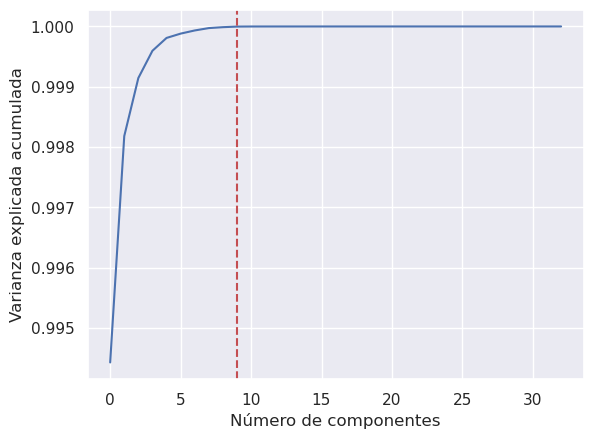

In [304]:
pca = PCA().fit(X)

number_pca_used = 9

plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.axvline(x=number_pca_used,color='r',linestyle="--")
plt.xlabel('Número de componentes')
plt.ylabel('Varianza explicada acumulada')

pca = PCA(n_components=number_pca_used)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

In [305]:
# Inicializamos XGBoost con sus hiperparámetros por defecto
xgb_regressor = xgb.XGBRegressor(objective='reg:squarederror', random_state=42, n_jobs=-1)
xgb_regressor.fit(X_train_pca, y_train)

#Predecimos
y_predicted = xgb_regressor.predict(X_test_pca)
dataframe_metricas,dataframe_comparacion_grafica = obtener_metricas(dataframe_metricas, "XGBoost (dataset PCA)", y_test,y_predicted,tolerancia=2)

,Modelo,MAE,MSE,RMSE,R2,Precision
0,Heuristica,3.097119,23.421262,4.839552,0.014931,0.115810
1,Regresion Lineal,0.459236,0.347714,0.589673,0.166044,0.471023
2,Ridge,0.459236,0.347714,0.589673,0.166044,0.471023
3,SVR,0.505728,0.423305,0.650619,-0.015253,0.278149
4,KNN,0.488525,0.405787,0.637014,0.026763,0.403292
5,Arbol decision,0.463221,0.352669,0.593859,0.154161,0.480311
6,Bosque Aleatorio,0.463234,0.352669,0.593860,0.154160,0.480311
7,AdaBoost,0.467060,0.348150,0.590042,0.165000,0.473087
8,XGBoost,0.451536,0.337151,0.580647,0.191379,0.482918
9,XGBoost (dataset con columna dia),0.436950,0.306589,0.553705,0.264679,0.505024


Finalmente, volvemos a ordenar y comparar según qué modelo tiene mejor performance:

In [306]:
dataframe_metricas.sort_values(by=['MAE'], ascending=True)

,Modelo,MAE,MSE,RMSE,R2,Precision
9,XGBoost (dataset con columna dia),0.436950,0.306589,0.553705,0.264679,0.505024
10,XGBoost (dataset weather code 1 hot),0.437042,0.305533,0.552750,0.267212,0.507034
11,XGBoost (dataset PCA),0.450413,0.325583,0.570599,0.219123,0.490739
8,XGBoost,0.451536,0.337151,0.580647,0.191379,0.482918
1,Regresion Lineal,0.459236,0.347714,0.589673,0.166044,0.471023
2,Ridge,0.459236,0.347714,0.589673,0.166044,0.471023
5,Arbol decision,0.463221,0.352669,0.593859,0.154161,0.480311
6,Bosque Aleatorio,0.463234,0.352669,0.593860,0.154160,0.480311
7,AdaBoost,0.467060,0.348150,0.590042,0.165000,0.473087
4,KNN,0.488525,0.405787,0.637014,0.026763,0.403292


## 7. Conclusiones

- Se exploró la posibilidad de juntar dos datasets diferentes (datos del clima y robos en la ciudad) para crear un dataset en conjunto e intentar predecir cantidad de robos dada una condición climática.
- Se hizo evidente la importancia de comprender los datos y realizar un trabajo previo de feature engineering antes de entrenar el modelo:
    - También que utilizar una métrica propia en función del problema que queremos resolver nos aporta una visibilidad mucho más directa acerca de qué tan bueno es el modelo.
- Luego de probar varios modelos se comprobó que aquellos que presentan mejor performance para predecir la variable objetivo (cantidad de robos) son los de ensamble, en especial XGBoost. Atribumos este comportamiento a:
    - Los modelos de ensamble capturan mejor alinealidades y relaciones complejas entre los datos.
    - Presentan una mejor relación de sesgo-varianza (al combinar varias predicciones de varios modelos se logra reducir el error de varianza).
    - Son más inmunes a datos ruidosos.
- Sería posible obtener un modelo mucho más sencillo al reducir la dimensionalidad de las características de entrada, sacrificando poca precisión.
    -  Por ejemplo, se ve que al aplicar PCA y reducir a 9 features la precisión se reduce de 50,5% a
- Predecir cantidad de robos en un cierto día basado en las condiciones climáticas no es sencillo:
    - Para una tolerancia de un error de ±2 robos, la precisón obtenida es baja (50,5%)
    - Si ampliamos la tolerancia (por ejemplo ±4 robos) podríamos obtener una precisión más aceptable (alrededor del 68%). Sin embargo, teniendo en cuenta que la media de cantidad de robos es de 6 días, tener una tolerancia de ±4 es bastante grande.
    - Por otro lado, no nos sorprende que el problema a resolver sea díficil:
        - Viendo el cuadro de correlación y los pairplots, no hay ninguna relación mediana o fuerte entre la cantidad de robos y las características climáticas.
        - Al agregar más datos que no se relacionan con condiciones climáticas (por ejemplo, día de la semana), vemos que hay mejoras, lo que vuelve a demostrar que la relación entre el clima y cantidad de robos no es fuerte.